# Queensland Drug Crimes

This notebook aggregates all of the work done over the semester and means that what we have done is a lot more clear. It also gives us an opportunity to easily peer review work, and double check our methods

In [192]:
import pandas as pd
import geopandas as gpd
import folium
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import pylab
import seaborn as sns

In [193]:
from sklearn.linear_model import Ridge, Lasso, LinearRegression, PoissonRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler, normalize

## Data Preparation

### Get Census Metadata and match LGAs with LGAs in crime data set

In [194]:
lga_codes = pd.read_csv("DataSets/Census Data/2016_GCP_LGA_for_QLD_short-header/Metadata/LGA_OTHER_CODES.csv")
lga_codes = lga_codes[lga_codes["ASGS_Structure"] == "LGA"]
lga_codes.head()

,ASGS_Structure,Census_Code_2016,ASGS_Code_2016,Census_Name_2016,Area sqkm
169,LGA,LGA10050,10050,Albury (C),305.9459
170,LGA,LGA10130,10130,Armidale Regional (A),8620.6990
171,LGA,LGA10250,10250,Ballina (A),484.9389
172,LGA,LGA10300,10300,Balranald (A),21690.6753
173,LGA,LGA10470,10470,Bathurst Regional (A),3817.8646


In [195]:
crime_data_lga = pd.read_csv("DataSets/LGA_Reported_Offences_Rates.csv", index_col= 90)

In [196]:
# A function which takes in the LGAs in crime data and matches them with the lgas in the lga_codes dataframe
def match_lgas(crime_lga):
    remove_words = ["Shire", "Council", "Regional", "City", " "]
    clga = crime_lga
    for word in remove_words:
        clga = clga.replace(word, "")
    
    for lga in sorted(lga_codes["Census_Name_2016"].unique()):
        if clga in lga:
            return lga_codes[lga_codes["Census_Name_2016"] == lga]["Census_Code_2016"].values[0]

crime_data_lga["Census Code"] = crime_data_lga["LGA Name"].map(match_lgas)
crime_data_lga[["Census Code", "LGA Name"]].head()

,Census Code,LGA Name
1,LGA30250,Aurukun Shire Council
2,LGA30250,Aurukun Shire Council
3,LGA30250,Aurukun Shire Council
4,LGA30250,Aurukun Shire Council
5,LGA30250,Aurukun Shire Council


In [197]:
# Change the format of the dates in the crime data
month_dict = {
    "JAN":1,
    "FEB":2,
    "MAR":3,
    "APR":4,
    "MAY":5,
    "JUN":6,
    "JUL":7,
    "AUG":8,
    "SEP":9,
    "OCT":10,
    "NOV":11,
    "DEC":12
}

# Convert dates to timestamp (choose arbitrarily the first of each month)
crime_data_lga["Date"] = crime_data_lga["Month Year"].map(lambda x: f"{month_dict[x[:3]]}-1-20{x[3:]}")
crime_data_lga["Date"] = pd.to_datetime(crime_data_lga["Date"])
crime_data_lga["Year"] = crime_data_lga["Month Year"].map(lambda x: f"20{x[3:]}")
crime_data_lga["Month"] = crime_data_lga["Month Year"].map(lambda x: f"{month_dict[x[:3]]}")

crime_data_lga[["Month Year", "Date", "Year", "Month"]].head()

,Month Year,Date,Year,Month
1,JAN01,2001-01-01,2001,1
2,FEB01,2001-02-01,2001,2
3,MAR01,2001-03-01,2001,3
4,APR01,2001-04-01,2001,4
5,MAY01,2001-05-01,2001,5


### Extract Drug information from crime data and match it to census data

Here, we want to extract out our target variable, which is the total number of drug related crimes. Since the Drug Offences variable is a sum of the other drug related variables, we want to remove those other variables from the dataset as well. 

In [198]:
drug_offences = crime_data_lga[["Census Code", "Drug Offences", "Year"]]
drug_offences.head()

,Census Code,Drug Offences,Year
1,LGA30250,0.00000,2001
2,LGA30250,93.10987,2001
3,LGA30250,0.00000,2001
4,LGA30250,93.10987,2001
5,LGA30250,0.00000,2001


Get the total number of drug offences in 2016 for each LGA code

In [199]:
drug_offences_2016 = drug_offences[drug_offences["Year"] == "2016"].groupby("Census Code").sum()
drug_offences_2016.head()

,Drug Offences
Census Code,
LGA30250,6500.377929
LGA30300,5492.042143
LGA30370,1530.542210
LGA30410,1753.179787
LGA30450,1102.941176


#### Get Census Data and merge

In [200]:
g01_data = pd.read_csv("DataSets/Census Data/2016_GCP_LGA_for_QLD_short-header/2016 Census GCP Local Government Areas for QLD/2016Census_G01_QLD_LGA.csv", index_col=0)
print(g01_data.shape)
g01_data.head()

(80, 108)


,Tot_P_M,Tot_P_F,Tot_P_P,Age_0_4_yr_M,Age_0_4_yr_F,Age_0_4_yr_P,Age_5_14_yr_M,Age_5_14_yr_F,Age_5_14_yr_P,Age_15_19_yr_M,...,High_yr_schl_comp_Yr_8_belw_P,High_yr_schl_comp_D_n_g_sch_M,High_yr_schl_comp_D_n_g_sch_F,High_yr_schl_comp_D_n_g_sch_P,Count_psns_occ_priv_dwgs_M,Count_psns_occ_priv_dwgs_F,Count_psns_occ_priv_dwgs_P,Count_Persons_other_dwgs_M,Count_Persons_other_dwgs_F,Count_Persons_other_dwgs_P
LGA_CODE_2016,,,,,,,,,,,,,,,,,,,,,
LGA30250,632,635,1269,61,49,113,127,130,260,36,...,220,10,3,15,583,596,1183,70,33,102
LGA30300,2251,2129,4377,149,151,301,349,288,643,136,...,304,16,12,23,1951,1853,3806,385,301,688
LGA30370,7388,6928,14319,519,526,1048,1099,1023,2119,397,...,1012,37,18,56,6517,6242,12760,1870,866,2737
LGA30410,1449,1419,2865,110,86,196,192,192,388,59,...,244,5,0,9,1248,1267,2515,389,339,725
LGA30450,149,123,267,6,3,14,11,14,28,11,...,35,0,0,3,126,104,232,81,51,139


In [201]:
g02_data = pd.read_csv("DataSets/Census Data/2016_GCP_LGA_for_QLD_short-header/2016 Census GCP Local Government Areas for QLD/2016Census_G02_QLD_LGA.csv", index_col=0)
print(g02_data.shape)
g02_data.head()

(80, 8)


,Median_age_persons,Median_mortgage_repay_monthly,Median_tot_prsnl_inc_weekly,Median_rent_weekly,Median_tot_fam_inc_weekly,Average_num_psns_per_bedroom,Median_tot_hhd_inc_weekly,Average_household_size
LGA_CODE_2016,,,,,,,,
LGA30250,28,0,260,100,678,1.4,992,4.2
LGA30300,40,1161,662,150,1485,0.8,1230,2.5
LGA30370,37,1517,714,190,1895,0.8,1575,2.6
LGA30410,42,1040,684,100,1514,0.8,1149,2.3
LGA30450,46,338,774,82,1687,0.7,1187,1.9


In [202]:
merged_census = g01_data.join(g02_data, how = "inner")
merged_census_with_drug = merged_census.join(drug_offences_2016, how="inner")

In [203]:
# Drop Sensitive Columns
merged_census_with_drug = merged_census_with_drug.drop(
    [
        "Indigenous_psns_Aboriginal_M", 
        "Indigenous_psns_Aboriginal_F", 
        "Indig_Bth_Abor_Torres_St_Is_M",
        "Indig_Bth_Abor_Torres_St_Is_F",
        "Indigenous_psns_Aboriginal_F",
        "Indigenous_psns_Aboriginal_M",
        "Australian_citizen_F",
        "Australian_citizen_M",
        "Indig_Bth_Abor_Torres_St_Is_P",
    ],
    axis = 1
)

In [204]:
print(f"The number of LGAs in the Census that are not in the drug data is {merged_census.shape[0] - merged_census_with_drug.shape[0]}")
print("We only therefore consider census data for lgas with drug data associated with it!!")

The number of LGAs in the Census that are not in the drug data is 24
We only therefore consider census data for lgas with drug data associated with it!!


### Finish prepping the crime data dataset

The crime data set is made up of categories and subcategories which add together to make the main categories. Since the categories and sub categories will be highly correlated, they may influence the analysis. The approach that we will take is to therefore remove all of the subcategories so that we only have to look at the main categories. This will simplify the analysis a lot!

In [205]:
categories = [
    'Homicide (Murder)',
    'Other Homicide',
    'Assault',
    'Sexual Offences',
    'Robbery',
    'Other Offences Against the Person',
    'Unlawful Entry',
    'Arson',
    'Other Property Damage',
	'Unlawful Use of Motor Vehicle',
	'Other Theft (excl. Unlawful Entry)',
    'Fraud',
    'Handling Stolen Goods',
    'Drug Offences',
    'Prostitution Offences',
    'Liquor (excl. Drunkenness)',
	'Gaming Racing & Betting Offences',
	'Breach Domestic Violence Protection Order',
	'Trespassing and Vagrancy',
	'Weapons Act Offences',
    'Good Order Offences',
    'Stock Related Offences',
	'Traffic and Related Offences',
    'Miscellaneous Offences'
]

columns_to_keep = ["Year", "Month", "Census Code", "LGA Name"] + categories

In [206]:
crime_data_lga2 = crime_data_lga[columns_to_keep]
crime_data_lga2.index = pd.MultiIndex.from_frame(crime_data_lga2[["Census Code", "Year", "Month"]])

crime_data_lga2 = crime_data_lga2.drop(["Census Code", "Year", "Month", "LGA Name"], axis=1)

In [207]:
crime_data_lga2.head()

Homicide (Murder)  Other Homicide      Assault  \
Census Code Year Month                                                   
LGA30250    2001 1                    0.0             0.0  1210.428305   
                 2                    0.0             0.0  1396.648045   
                 3                    0.0             0.0  2048.417132   
                 4                    0.0             0.0  1210.428305   
                 5                    0.0             0.0   837.988827   

                        Sexual Offences  Robbery  \
Census Code Year Month                             
LGA30250    2001 1                  0.0      0.0   
                 2                  0.0      0.0   
                 3                  0.0      0.0   
                 4                  0.0      0.0   
                 5                  0.0      0.0   

                        Other Offences Against the Person  Unlawful Entry  \
Census Code Year Month                                                      
LGA30250    2001 1                               0.000000      279.329609   
                 2                               0.000000       93.109870   
                 3                               0.000000       93.109870   
                 4                             186.219739       93.109870   
                 5                               0.000000      186.219739   

                           Arson  Other Property Damage  \
Census Code Year Month                                    
LGA30250    2001 1      93.10987             465.549348   
                 2       0.00000             744.878957   
                 3       0.00000             651.769088   
                 4       0.00000             279.329609   
                 5       0.00000             372.439479   

                        Unlawful Use of Motor Vehicle  ...  \
Census Code Year Month                                 ...   
LGA30250    2001 1                         279.329609  ...   
                 2                         744.878957  ...   
                 3                         279.329609  ...   
                 4                         651.769088  ...   
                 5                           0.000000  ...   

                        Prostitution Offences  Liquor (excl. Drunkenness)  \
Census Code Year Month                                                      
LGA30250    2001 1                        0.0                     0.00000   
                 2                        0.0                     0.00000   
                 3                        0.0                    93.10987   
                 4                        0.0                     0.00000   
                 5                        0.0                     0.00000   

                        Gaming Racing & Betting Offences  \
Census Code Year Month                                     
LGA30250    2001 1                                   0.0   
                 2                                   0.0   
                 3                                   0.0   
                 4                                   0.0   
                 5                                   0.0   

                        Breach Domestic Violence Protection Order  \
Census Code Year Month                                              
LGA30250    2001 1                                     186.219739   
                 2                                     186.219739   
                 3                                     279.329609   
                 4                                     465.549348   
                 5                                       0.000000   

                        Trespassing and Vagrancy  Weapons Act Offences  \
Census Code Year Month                                                   
LGA30250    2001 1                     93.109870             93.109870   
                 2                    465.549348             93.109870   
          

### Clean Location Data

In [208]:
location_data = gpd.read_file("./DataSets/qld_lgas.json")
location_data["qld_lga__3"].sort_values().unique()[0:5]

array(['AURUKUN', 'BALONNE', 'BANANA', 'BARCALDINE', 'BARCOO'],
      dtype=object)

# Exploratory Data Analysis

Determining Basic Info and Motivation

### Create Map in 2016

In [209]:
def transform_LGA(lga):
    lga = lga.replace("Regional", "")
    lga = lga.replace("Council", "")
    lga = lga.replace("Shire", "")
    lga = lga.replace("-", " ")
    lga = lga.replace("City", "")
    lga = lga.replace(" Town", "")
    lga = lga.strip().upper()
    return lga

drug_info = crime_data_lga[["LGA Name", "Date", "Year", "Drug Offences"]]
drug_info["Location LGA"] = drug_info["LGA Name"].map(transform_LGA)
drug_info_agg = drug_info[drug_info["Year"] == "2016"].groupby("Location LGA").sum()

/tmp/ipykernel_1673/1165584837.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  drug_info["Location LGA"] = drug_info["LGA Name"].map(transform_LGA)


In [210]:
qld_map = folium.Map(location=[-24.47, 153.02], zoom_start=4)

scale = np.percentile(drug_info_agg["Drug Offences"], np.linspace(0, 100, 10))
print(scale)

folium.Choropleth(
    geo_data=r"DataSets/qld_lgas.json",
    data = drug_info_agg["Drug Offences"],
    columns=["Location LGA", "Drug Offences"],
    key_on = 'feature.properties.qld_lga__3',
    threshold_scale=scale, 
    fill_color='YlOrRd',
    nan_fill_color="grey",
    fill_opacity=0.8, 
    line_opacity=0.5,
).add_to(qld_map)

qld_map

[    0.          1036.92951805  1342.0120222   1616.29213512
  1864.97081355  2119.29122137  2499.19875148  3070.06422785
  4023.96874418 20108.27532867]


<AxesSubplot:xlabel='Year', ylabel='Number of Offences'>

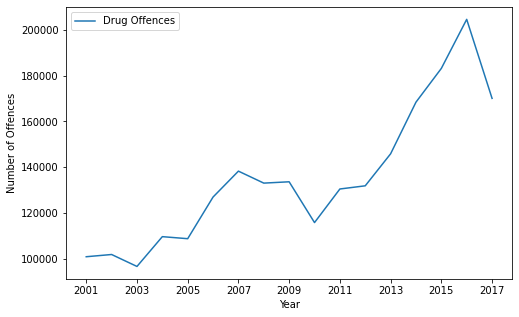

In [211]:
drug_info_agg2 = drug_info[drug_info["Year"] < "2018"].groupby("Year").sum()
drug_info_agg2.plot(figsize = (8, 5), xlabel="Year", ylabel="Number of Offences")

## Further EDA

In [212]:
eda_crime_data = crime_data_lga[columns_to_keep + ['Date']].drop(["Year", "Month", "Census Code"], axis=1)#.groupby("Date").mean()

<AxesSubplot:>

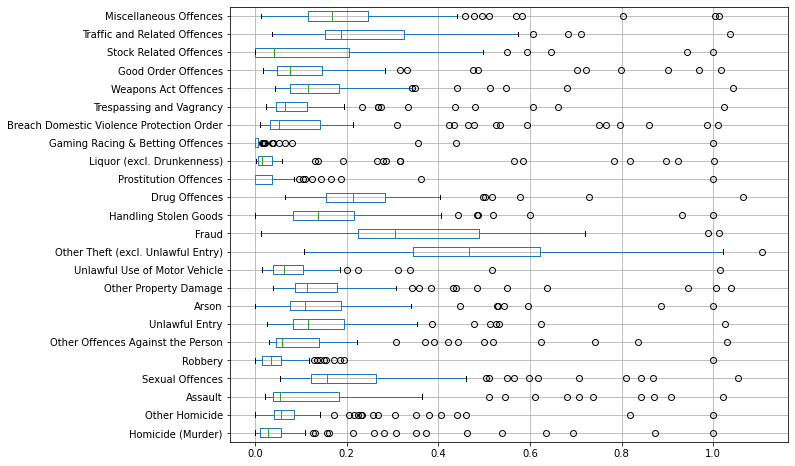

In [213]:
grouped = eda_crime_data.groupby("LGA Name").mean()
# normalised = pd.DataFrame(normalize(grouped), index = grouped.index, columns=grouped.columns)
standardized = grouped.max() - grouped.min()
# normalised.boxplot(vert=False, figsize=(10, 8))
grouped /= standardized
grouped.boxplot(vert=False, figsize=(10, 8))


In [214]:
eda_crime_data.describe()

,Homicide (Murder),Other Homicide,Assault,Sexual Offences,Robbery,Other Offences Against the Person,Unlawful Entry,Arson,Other Property Damage,Unlawful Use of Motor Vehicle,...,Prostitution Offences,Liquor (excl. Drunkenness),Gaming Racing & Betting Offences,Breach Domestic Violence Protection Order,Trespassing and Vagrancy,Weapons Act Offences,Good Order Offences,Stock Related Offences,Traffic and Related Offences,Miscellaneous Offences
count,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,...,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000,19812.000000
mean,0.366872,0.461213,158.490949,23.794553,1.990766,22.146439,112.014535,3.595756,125.032119,24.631657,...,0.088869,134.502625,0.028495,121.339929,20.455086,23.218525,251.663259,5.561328,151.191563,7.882316
std,6.663693,7.057535,299.058856,119.359344,12.800009,84.327453,179.540258,19.090476,191.092904,68.877925,...,1.045358,448.703476,1.394108,249.385195,65.695834,70.588499,507.185587,53.031152,210.587978,33.783775
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,22.838350,0.000000,0.000000,0.000000,26.417339,0.000000,38.222647,0.000000,...,0.000000,0.000000,0.000000,8.464534,0.000000,0.000000,46.208052,0.000000,59.310306,0.000000
50%,0.000000,0.000000,45.637473,5.382228,0.000000,3.156217,64.022350,0.000000,70.279534,7.995950,...,0.000000,4.388660,0.000000,29.314338,3.974484,5.771673,97.797337,0.000000,95.090115,0.000000
75%,0.000000,0.000000,133.155792,17.016775,0.605534,10.818030,122.729064,1.931372,121.854288,22.254661,...,0.000000,32.594524,0.000000,95.785441,13.807387,16.559033,205.773347,0.000000,164.549223,4.035089
max,321.543408,312.500000,7342.922029,10408.163265,701.754386,3448.275862,3950.338601,656.934307,3106.212425,1441.441441,...,90.171326,7317.073171,124.481328,5860.255447,2618.657938,2398.081535,10104.529617,5166.051661,5617.977528,1176.470588


In [215]:
drug_corr = eda_crime_data.corr()["Drug Offences"].sort_values(ascending=False).drop("Drug Offences")

<AxesSubplot:>

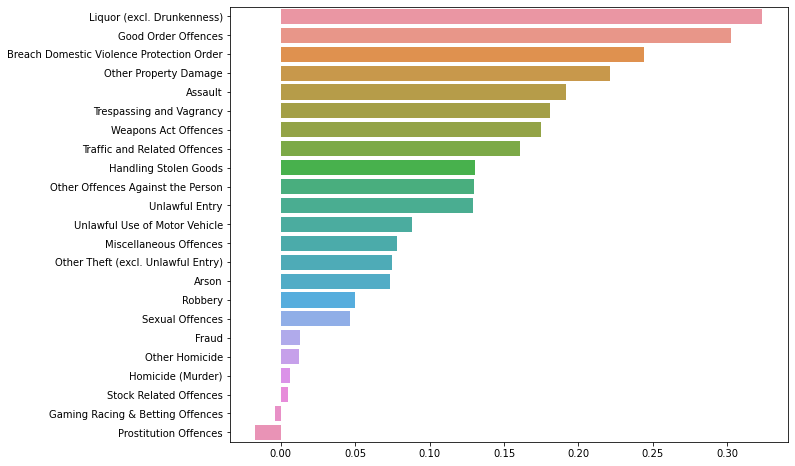

In [216]:
plt.figure(figsize=(10, 8))
sns.barplot(y = drug_corr.index, x = drug_corr.values)

In [217]:
mean_over_time = eda_crime_data.groupby("Date").mean()

In [218]:
change = (mean_over_time/mean_over_time.iloc[0, :] - 1)*100

In [219]:
plot_func = change.rolling(window=30).mean()

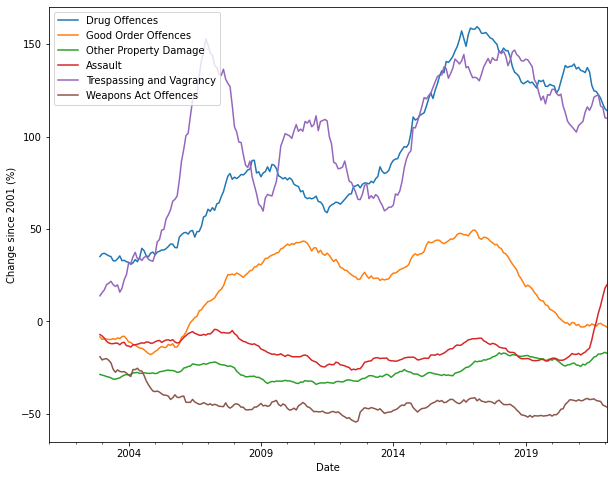

In [220]:
change.rolling(window=24).mean().plot(
    y=[
        "Drug Offences",
        #  'Liquor (excl. Drunkenness)',
        'Good Order Offences',
        'Other Property Damage',
        'Assault',  
        'Trespassing and Vagrancy', 
        'Weapons Act Offences'
        ], 
        figsize=(10, 8),
        ylabel = "Change since 2001 (%)",
    )

plt.legend(loc = 'upper left')

## Census Data Set

In [231]:
merged_census_with_drug.describe()

,Tot_P_M,Tot_P_F,Tot_P_P,Age_0_4_yr_M,Age_0_4_yr_F,Age_0_4_yr_P,Age_5_14_yr_M,Age_5_14_yr_F,Age_5_14_yr_P,Age_15_19_yr_M,...,Count_Persons_other_dwgs_P,Median_age_persons,Median_mortgage_repay_monthly,Median_tot_prsnl_inc_weekly,Median_rent_weekly,Median_tot_fam_inc_weekly,Average_num_psns_per_bedroom,Median_tot_hhd_inc_weekly,Average_household_size,Drug Offences
count,56.000000,56.000000,5.600000e+01,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,...,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000,56.000000
mean,26715.910714,27200.732143,5.391709e+04,1783.214286,1691.714286,3475.642857,3623.500000,3435.339286,7058.750000,1757.553571,...,5568.553571,37.089286,1057.375000,607.875000,183.410714,1415.500000,0.908929,1206.625000,2.685714,2787.569099
std,78404.289517,80924.617505,1.593262e+05,5043.903109,4808.555151,9852.289069,9833.944761,9319.521399,19153.665294,5045.882162,...,12583.968921,7.277054,650.793406,174.533567,89.883920,384.473524,0.215977,282.366272,0.604657,3145.303476
min,148.000000,123.000000,2.670000e+02,4.000000,3.000000,14.000000,11.000000,12.000000,28.000000,4.000000,...,40.000000,21.000000,0.000000,260.000000,65.000000,678.000000,0.700000,740.000000,1.900000,0.000000
25%,488.750000,492.750000,9.607500e+02,48.500000,44.750000,93.000000,89.250000,87.000000,182.000000,34.500000,...,212.000000,33.500000,667.750000,520.000000,115.000000,1230.750000,0.800000,1026.500000,2.300000,1484.781038
50%,1961.000000,1909.500000,3.943000e+03,141.000000,144.500000,285.500000,304.000000,289.000000,583.500000,130.500000,...,1428.500000,38.000000,1300.000000,654.000000,150.500000,1460.500000,0.800000,1173.000000,2.500000,1900.331007
75%,17776.500000,16625.250000,3.440150e+04,1066.250000,963.250000,2034.250000,2251.000000,2031.750000,4282.500000,970.000000,...,6831.000000,42.250000,1518.000000,699.250000,262.500000,1599.000000,0.925000,1350.000000,2.625000,2891.320823
max,556440.000000,574720.000000,1.131155e+06,34759.000000,33161.000000,67922.000000,67529.000000,63822.000000,131355.000000,35109.000000,...,86935.000000,50.000000,2000.000000,1030.000000,390.000000,2365.000000,1.700000,2138.000000,4.800000,20108.275329


In [232]:
merged_census_with_drug.info()

<class 'pandas.core.frame.DataFrame'>
Index: 56 entries, LGA30250 to LGA37600
Columns: 110 entries, Tot_P_M to Drug Offences
dtypes: float64(3), int64(107)
memory usage: 50.6+ KB


<AxesSubplot:>

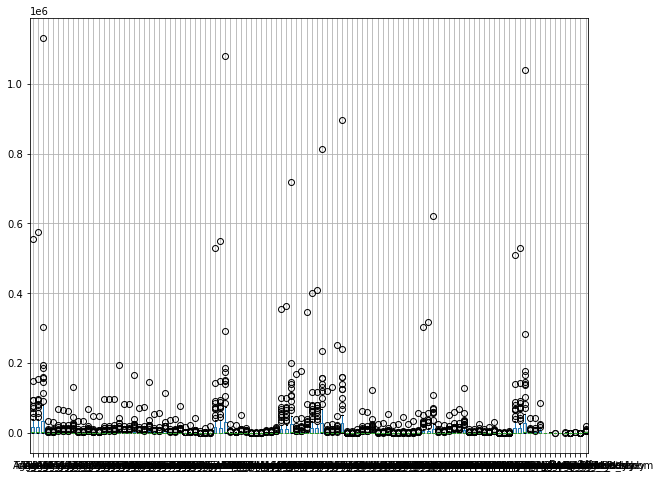

In [235]:
merged_census_with_drug.boxplot(vert=True, figsize=(10, 8))

<AxesSubplot:>

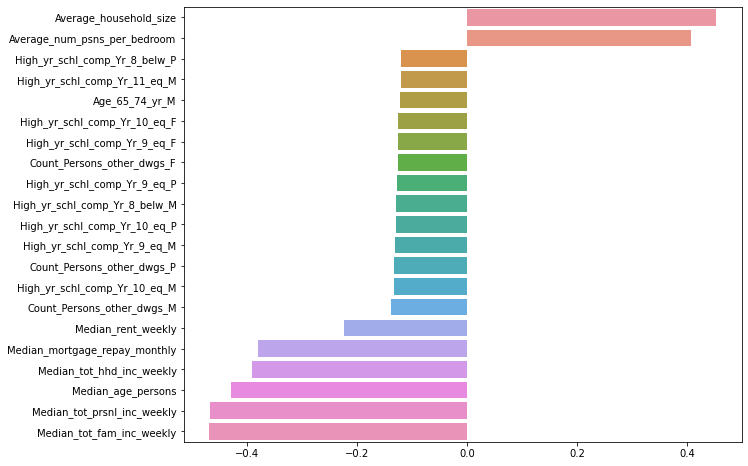

In [237]:
drug_corr = merged_census_with_drug.corr()["Drug Offences"].sort_values(ascending = False).drop("Drug Offences")
drug_corr = drug_corr[drug_corr.abs() > 0.12]
plt.figure(figsize=(10, 8))
sns.barplot(y = drug_corr.index, x = drug_corr.values)

<AxesSubplot:>

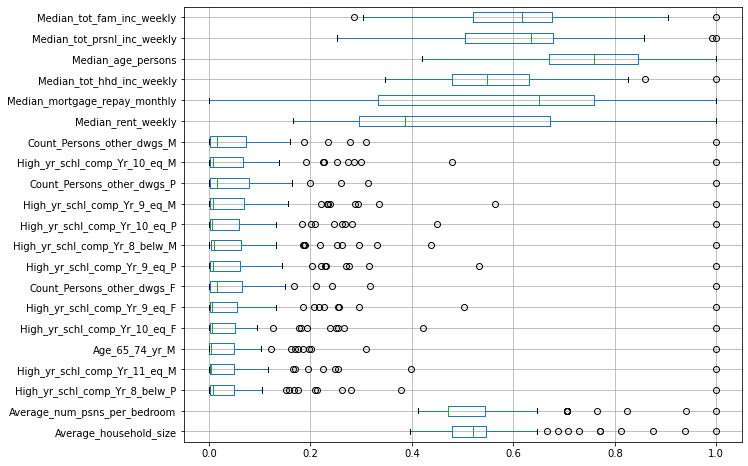

In [242]:
top_corrs = merged_census_with_drug[drug_corr.index]
standardized = top_corrs.max()# - top_corrs.min()
top_corrs /= standardized
top_corrs.boxplot(vert=False, figsize=(10, 8))

# merged_census_with_drug[drug_corr.index].boxplot(vert=False, figsize=(10, 8))

# Model Selection

We have two data sets which we want to analyse now... the crime dataset and the census dataset.

In [224]:
print(f"The size of the crime dataset is {crime_data_lga2.shape[0]} rows and {crime_data_lga2.shape[1]-1} columns")
print(f"The size of the census {merged_census_with_drug.shape[0]} rows and {merged_census_with_drug.shape[1]-1} columns")

The size of the crime dataset is 19812 rows and 23 columns
The size of the census 56 rows and 109 columns


### Crime Data Set

In [225]:
X = crime_data_lga2.copy()
y = X.pop("Drug Offences")

In [226]:
# Run Linear Regression
linear_model = LinearRegression()
linear_model.fit(X, y)
y_pred = linear_model.predict(X)

linear_mse = mean_squared_error(y, y_pred)

print(f"MSE = {linear_mse}")

MSE = 52918.561774729795


In [227]:
# Run Poisson Regression
standardize = StandardScaler()
X_scaled = standardize.fit_transform(X)

poisson_model = PoissonRegressor()
poisson_model.fit(X_scaled, y)
y_pred = poisson_model.predict(X_scaled)

poisson_mse = mean_squared_error(y, y_pred)

print(f"MSE = {poisson_mse}")

MSE = 57171.2674570365


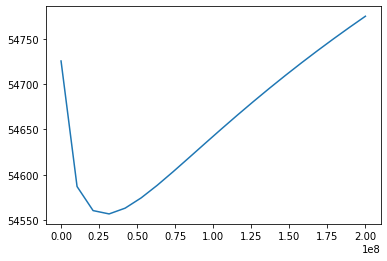

MSE = 53090.577015586794


In [228]:
# Run Ridge Regression
alpha_range = np.linspace(100000, 200000000, 20)

k_fold = KFold(n_splits=5)
k_fold.get_n_splits(X)
square_errors = []
for alpha in alpha_range:
    mse = []
    for training_indices, testing_indices in k_fold.split(X):
        X_train, X_test = X.iloc[training_indices], X.iloc[testing_indices]
        y_train, y_test = y.iloc[training_indices], y.iloc[testing_indices]
        model = Ridge(alpha=alpha)
        model.fit(X_train, y_train)
        y_predict = model.predict(X_test)
        mse.append(mean_squared_error(y_test, y_predict))
    square_errors.append(np.mean(mse))

plt.plot(alpha_range, square_errors)
plt.show()

alpha_min = alpha_range[np.argmin(square_errors)]

ridge_model = Ridge(alpha = alpha_min)
ridge_model.fit(X, y)
y_pred = ridge_model.predict(X)

ridge_mse = mean_squared_error(y, y_pred)

print(f"MSE = {ridge_mse}")

In [229]:
# Run Lasso Regression
alpha_range = np.linspace(0.1, 500, 20)

k_fold = KFold(n_splits=5)
k_fold.get_n_splits(X)
square_errors = []
for alpha in alpha_range:
    mse = []
    for training_indices, testing_indices in k_fold.split(X):
        X_train, X_test = X.iloc[training_indices], X.iloc[testing_indices]
        y_train, y_test = y.iloc[training_indices], y.iloc[testing_indices]
        model = Lasso(alpha=alpha)
        model.fit(X_train, y_train)
        y_predict = model.predict(X_test)
        mse.append(mean_squared_error(y_test, y_predict))
    square_errors.append(np.mean(mse))

plt.plot(alpha_range, square_errors)
plt.show()

alpha_min = alpha_range[np.argmin(square_errors)]

lasso_model = Lasso(alpha = alpha_min)
lasso_model.fit(X, y)
y_pred = lasso_model.predict(X)

lasso_mse = mean_squared_error(y, y_pred)

print(f"MSE = {lasso_mse}")

KeyboardInterrupt: 

In [ ]:
print(f"Linear Regression MSE {linear_mse}")
print(f"Poisson Regression MSE {poisson_mse}")
print(f"Ridge Regression MSE {ridge_mse}")
print(f"Lasso Regression MSE {lasso_mse}")

Linear Regression MSE 52918.561774729795
Poisson Regression MSE 57171.2674570365
Ridge Regression MSE 53090.577015586794
Lasso Regression MSE 53055.011967106286


Therefore, we choose Linear Regression for the Analysis of the crime dataset

### Census Data Set

In [ ]:
X = merged_census_with_drug.copy()
y = X.pop("Drug Offences")

In [ ]:
# Run Linear Regression
linear_model = LinearRegression()
linear_model.fit(X, y)
y_pred = linear_model.predict(X)

linear_mse = mean_squared_error(y, y_pred)

print(f"MSE = {linear_mse}")

MSE = 8.387033443703182e-17


In [ ]:
# Run Poisson Regression
standardize = StandardScaler()
X_scaled = standardize.fit_transform(X)

poisson_model = PoissonRegressor()
poisson_model.fit(X_scaled, y)
y_pred = poisson_model.predict(X_scaled)

poisson_mse = mean_squared_error(y, y_pred)

print(f"MSE = {poisson_mse}")

MSE = 3294230.9219942386


/home/james/Documents/DATA7001/project/venv/lib/python3.9/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


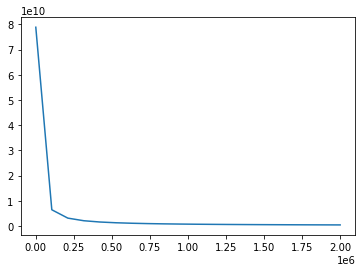

MSE = 6631535.873405538


In [ ]:
# Run Ridge Regression
alpha_range = np.linspace(0.1, 2000000, 20)

k_fold = KFold(n_splits=5)
k_fold.get_n_splits(X)
square_errors = []
for alpha in alpha_range:
    mse = []
    for training_indices, testing_indices in k_fold.split(X):
        X_train, X_test = X.iloc[training_indices], X.iloc[testing_indices]
        y_train, y_test = y.iloc[training_indices], y.iloc[testing_indices]
        model = Ridge(alpha=alpha)
        model.fit(X_train, y_train)
        y_predict = model.predict(X_test)
        mse.append(mean_squared_error(y_test, y_predict))
    square_errors.append(np.mean(mse))

plt.plot(alpha_range, square_errors)
plt.show()

alpha_min = alpha_range[np.argmin(square_errors)]

ridge_model = Ridge(alpha = alpha_min)
ridge_model.fit(X, y)
y_pred = ridge_model.predict(X)

ridge_mse = mean_squared_error(y, y_pred)

print(f"MSE = {ridge_mse}")

/home/james/Documents/DATA7001/project/venv/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.713e+07, tolerance: 4.971e+04
  model = cd_fast.enet_coordinate_descent(
/home/james/Documents/DATA7001/project/venv/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.024e+07, tolerance: 2.130e+04
  model = cd_fast.enet_coordinate_descent(
/home/james/Documents/DATA7001/project/venv/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale 

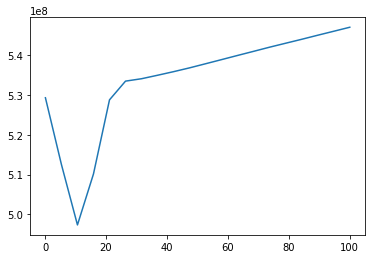

MSE = 4895873.861575191


/home/james/Documents/DATA7001/project/venv/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.377e+08, tolerance: 5.441e+04
  model = cd_fast.enet_coordinate_descent(


In [ ]:
# Run Lasso Regression
alpha_range = np.linspace(0.1, 100, 20)

k_fold = KFold(n_splits=5)
k_fold.get_n_splits(X)
square_errors = []
for alpha in alpha_range:
    mse = []
    for training_indices, testing_indices in k_fold.split(X):
        X_train, X_test = X.iloc[training_indices], X.iloc[testing_indices]
        y_train, y_test = y.iloc[training_indices], y.iloc[testing_indices]
        model = Lasso(alpha=alpha)
        model.fit(X_train, y_train)
        y_predict = model.predict(X_test)
        mse.append(mean_squared_error(y_test, y_predict))
    square_errors.append(np.mean(mse))

plt.plot(alpha_range, square_errors)
plt.show()

alpha_min = alpha_range[np.argmin(square_errors)]

lasso_model = Lasso(alpha = alpha_min)
lasso_model.fit(X, y)
y_pred = lasso_model.predict(X)

lasso_mse = mean_squared_error(y, y_pred)

print(f"MSE = {lasso_mse}")

In [ ]:
print(f"Linear Regression MSE {linear_mse}")
print(f"Poisson Regression MSE {poisson_mse}")
print(f"Ridge Regression MSE {ridge_mse}")
print(f"Lasso Regression MSE {lasso_mse}")

Linear Regression MSE 8.387033443703182e-17
Poisson Regression MSE 3294230.9219942386
Ridge Regression MSE 6631535.873405538
Lasso Regression MSE 4895873.861575191


Therefore, would use Linear Regression for the census analysis

## Model Fitting

### Crime Data

Here, we normalise each column so that the coefficients of the linear regression represent the size of the contribution

In [ ]:
X = crime_data_lga2.copy()
y = X.pop("Drug Offences")

X_norm = pd.DataFrame(normalize(X), index = X.index, columns = X.columns)

In [ ]:
# Run Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_norm, y)
y_pred = linear_model.predict(X_norm)

linear_mse = mean_squared_error(y, y_pred)
print(f"MSE = {linear_mse}")

residuals = y - y_pred

MSE = 56955.929985969444


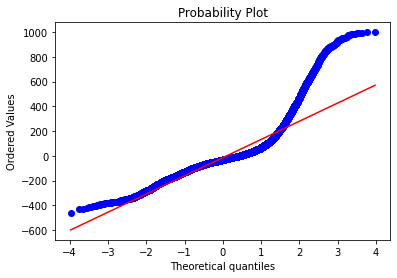

In [ ]:
stats.probplot(residuals[residuals < 1000], dist="norm", plot=pylab);

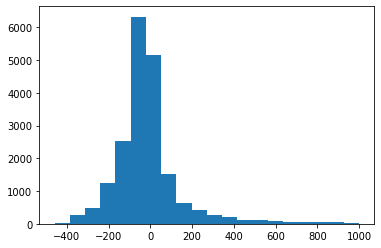

In [ ]:
plt.hist(residuals[residuals < 1000], bins = 20);

In [ ]:
coefficients = pd.Series(linear_model.coef_, index = X.columns)
coefficients=coefficients.sort_values(ascending = False)

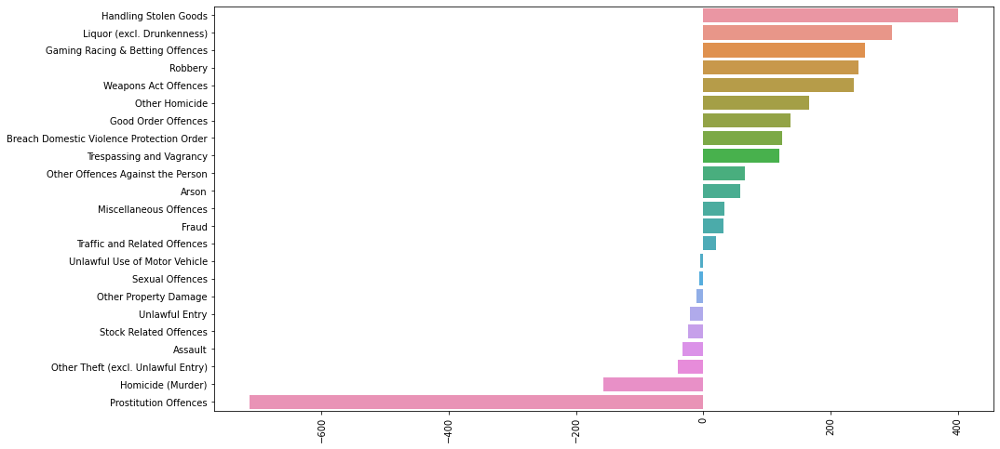

In [ ]:
plt.figure(figsize = (15, 8))
sns.barplot(y = coefficients.index, x = coefficients)
plt.xticks(rotation=90);

### Census Data

In [ ]:
X = merged_census_with_drug.copy()
y = X.pop("Drug Offences")

X_norm = pd.DataFrame(normalize(X), index = X.index, columns = X.columns)

In [ ]:
# Run Linear Regression
linear_model = LinearRegression()
linear_model.fit(X_norm, y)
y_pred = linear_model.predict(X_norm)

linear_mse = mean_squared_error(y, y_pred)
print(f"MSE = {linear_mse}")

residuals = y - y_pred

MSE = 3.505360060842342e-21


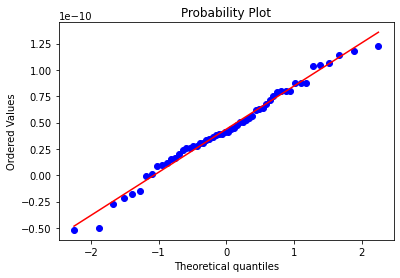

In [ ]:
stats.probplot(residuals, dist="norm", plot=pylab);

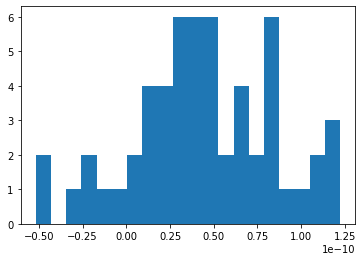

In [ ]:
plt.hist(residuals, bins = 20);

In [ ]:
coefficients = pd.Series(linear_model.coef_, index = X.columns)
coefficients=coefficients.sort_values(ascending = False)#[0:30]
coefficients = pd.concat([coefficients[0:15], coefficients[-15:]])

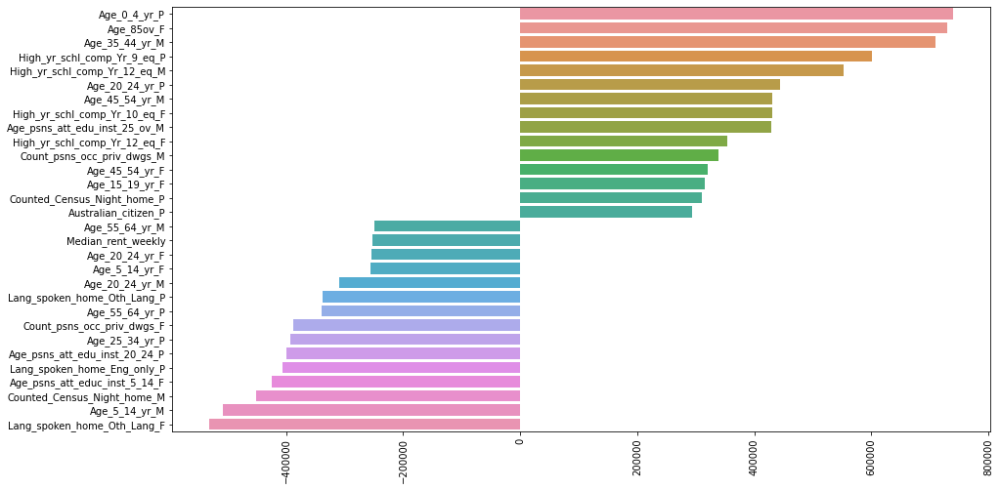

In [ ]:
plt.figure(figsize = (15, 8))
sns.barplot(y = coefficients.index, x = coefficients)
plt.xticks(rotation=90);

In [ ]:
coefficients

Age_0_4_yr_P                     740080.462618
Age_85ov_F                       729916.179029
Age_35_44_yr_M                   709376.269606
High_yr_schl_comp_Yr_9_eq_P      601445.810262
High_yr_schl_comp_Yr_12_eq_M     553262.163622
Age_20_24_yr_P                   443831.151312
Age_45_54_yr_M                   431211.439678
High_yr_schl_comp_Yr_10_eq_F     429996.795514
Age_psns_att_edu_inst_25_ov_M    429546.695681
High_yr_schl_comp_Yr_12_eq_F     354131.409728
Count_psns_occ_priv_dwgs_M       339710.872948
Age_45_54_yr_F                   321065.932699
Age_15_19_yr_F                   315641.556898
Counted_Census_Night_home_P      311104.447335
Australian_citizen_P             293263.063100
Age_55_64_yr_M                  -248561.154298
Median_rent_weekly              -252892.217617
Age_20_24_yr_F                  -254687.596323
Age_5_14_yr_F                   -256108.357911
Age_20_24_yr_M                  -309493.808938
Lang_spoken_home_Oth_Lang_P     -337747.925808
Age_55_64_yr_